In [1]:
!pip install pgmpy

In [2]:
import pandas as pd
import numpy as np

In [3]:
import pickle
import pgmpy

In [4]:
with open("../models/bayesian_18countries_learnt_bn_treesearch.pickle", "rb") as handle:
  model = pickle.load(handle)

In [5]:
train_df = pd.read_csv("../data/processed/train_18_countries.csv")
print(train_df.shape)
train_df.head()

(495, 307)


,deaths_per_mil_cat_india,facial_covering_new_zealand,cancel_public_events_argentina,debt_relief_india,income_support_singapore,school_closures_argentina,vaccine_policy_china,restriction_internal_movement_indonesia,workplace_closures_finland,internation_travel_control_finland,...,cases_per_mil_cat_finland,cases_per_mil_cat_hong_kong,cases_per_mil_cat_indonesia,cases_per_mil_cat_india,cases_per_mil_cat_israel,cases_per_mil_cat_malaysia,cases_per_mil_cat_new_zealand,cases_per_mil_cat_singapore,cases_per_mil_cat_united_states,cases_per_mil_cat_south_africa
0,0,3,2,1.0,2,1,5,2,1,2.0,...,1,0,1,1,5,3,0,1,6,2
1,0,2,2,0.0,2,3,4,2,2,3.0,...,1,0,0,1,4,1,0,1,4,1
2,0,3,1,1.0,2,0,5,2,1,2.0,...,4,0,1,1,6,4,0,3,6,3
3,0,3,2,1.0,2,1,5,2,1,2.0,...,1,0,1,1,5,3,0,1,5,2
4,0,2,2,0.0,2,1,4,2,2,3.0,...,1,0,0,0,4,1,0,1,4,1


In [6]:
test_df = pd.read_csv("../data/processed/test_18_countries.csv")
print(test_df.shape)
test_df.head()

(165, 307)


,deaths_per_mil_cat_india,facial_covering_new_zealand,cancel_public_events_argentina,debt_relief_india,income_support_singapore,school_closures_argentina,vaccine_policy_china,restriction_internal_movement_indonesia,workplace_closures_finland,internation_travel_control_finland,...,cases_per_mil_cat_finland,cases_per_mil_cat_hong_kong,cases_per_mil_cat_indonesia,cases_per_mil_cat_india,cases_per_mil_cat_israel,cases_per_mil_cat_malaysia,cases_per_mil_cat_new_zealand,cases_per_mil_cat_singapore,cases_per_mil_cat_united_states,cases_per_mil_cat_south_africa
0,0,3,1,1.0,2,0,5,2,1,2.0,...,4,0,1,1,6,4,0,3,6,3
1,0,3,2,1.0,2,1,5,2,1,2.0,...,1,0,1,1,6,3,0,1,6,2
2,0,2,2,2.0,2,3,0,2,1,3.0,...,0,0,0,0,1,0,0,1,1,1
3,0,3,2,1.0,2,1,5,2,1,2.0,...,1,0,1,1,5,3,0,1,5,2
4,0,0,2,2.0,2,3,0,1,1,3.0,...,0,0,0,0,0,0,0,0,1,0


In [7]:
from pgmpy.inference import VariableElimination

ve = VariableElimination(model)

/usr/local/lib/python3.7/dist-packages/statsmodels/tools/_testing.py:19: FutureWarning: pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.
  import pandas.util.testing as tm


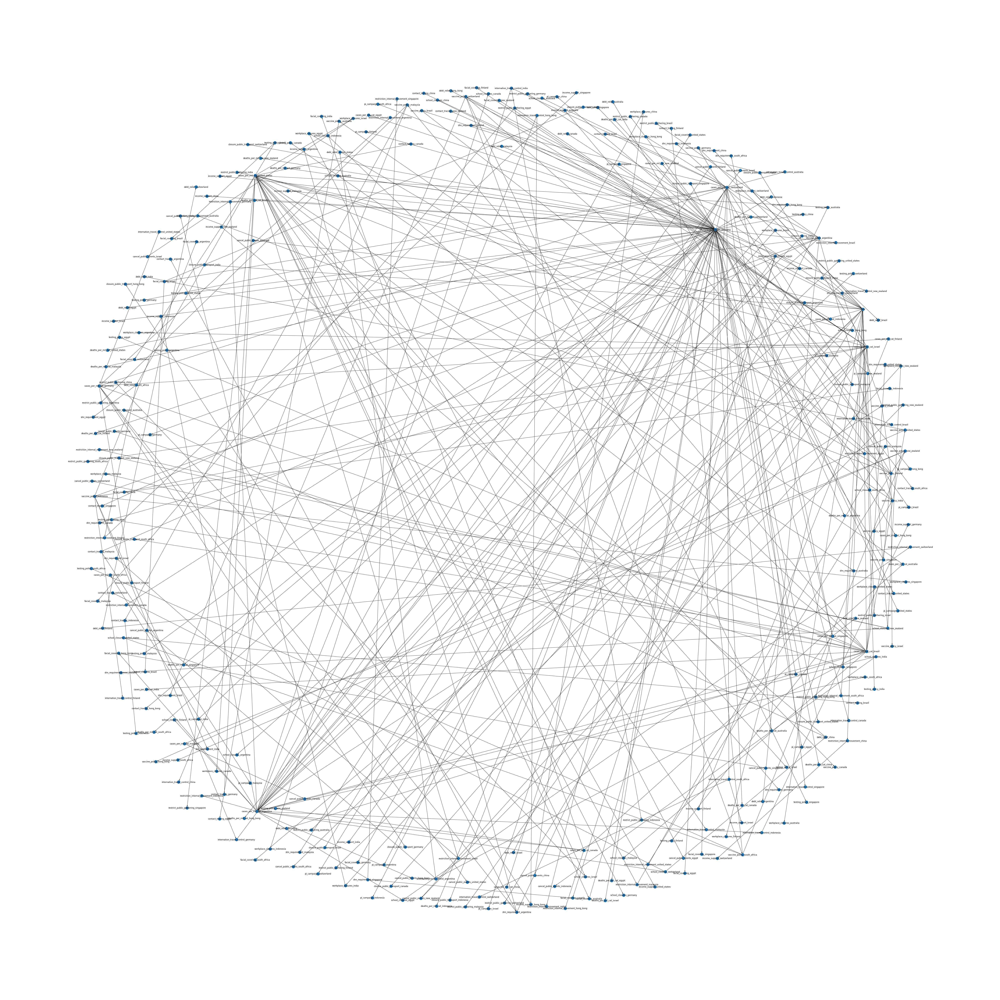

In [8]:
import networkx as nx
import matplotlib.pyplot as plt
fig, ax = plt.subplots(1,1, figsize=(80,80))
nx.draw(model, with_labels=True, ax=ax)
plt.tight_layout()

In [9]:
# sample
print(
    ve.query(
        ["vaccine_policy_china"], evidence={"vaccine_policy_finland": 1}
    )
)

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

+-------------------------+-----------------------------+
| vaccine_policy_china    |   phi(vaccine_policy_china) |
+=========================+=============================+
| vaccine_policy_china(0) |                      0.0000 |
+-------------------------+-----------------------------+
| vaccine_policy_china(1) |                      1.0000 |
+-------------------------+-----------------------------+
| vaccine_policy_china(2) |                      0.0000 |
+-------------------------+-----------------------------+
| vaccine_policy_china(4) |                      0.0000 |
+-------------------------+-----------------------------+
| vaccine_policy_china(5) |                      0.0000 |
+-------------------------+-----------------------------+


In [10]:
 res = ve.query(
        ["vaccine_policy_china"], evidence={"vaccine_policy_finland": 1}
    )
print(res)

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

+-------------------------+-----------------------------+
| vaccine_policy_china    |   phi(vaccine_policy_china) |
+=========================+=============================+
| vaccine_policy_china(0) |                      0.0000 |
+-------------------------+-----------------------------+
| vaccine_policy_china(1) |                      1.0000 |
+-------------------------+-----------------------------+
| vaccine_policy_china(2) |                      0.0000 |
+-------------------------+-----------------------------+
| vaccine_policy_china(4) |                      0.0000 |
+-------------------------+-----------------------------+
| vaccine_policy_china(5) |                      0.0000 |
+-------------------------+-----------------------------+


In [11]:
res.values

array([0., 1., 0., 0., 0.])

In [12]:
res.variables

['vaccine_policy_china']

In [13]:
res.state_names

{'vaccine_policy_china': [0, 1, 2, 4, 5]}

In [14]:
res.state_names[res.variables[0]]

[0, 1, 2, 4, 5]

In [15]:
[
    (key, val)
    for key, val in zip(res.state_names[res.variables[0]], res.values)
]

[(0, 0.0), (1, 1.0), (2, 0.0), (4, 0.0), (5, 0.0)]

In [16]:
test_df = test_df.astype(int)

In [17]:
cols_to_remove = list(set(test_df.columns) - set(model.nodes()))

In [18]:
cols_to_remove

[]

In [19]:
test_df.filter(regex="[a-z]_singapore")

,income_support_singapore,shn_requirement_singapore,contact_tracing_singapore,deaths_per_mil_cat_singapore,vaccine_policy_singapore,restriction_internal_movement_singapore,testing_policy_singapore,internation_travel_control_singapore,pi_campaign_singapore,school_closures_singapore,cancel_public_events_singapore,debt_relief_singapore,workplace_closures_singapore,restrict_public_gathering_singapore,closure_public_transport_singapore,facial_covering_singapore,cases_per_mil_cat_singapore
0,2,1,2,0,5,0,3,3,2,1,2,2,3,4,0,4,3
1,2,1,2,0,5,0,3,3,2,1,1,2,1,4,0,4,1
2,2,1,2,0,0,0,2,3,2,1,2,2,2,2,0,4,1
3,2,1,2,0,5,0,3,3,2,1,1,2,1,4,0,4,1
4,2,1,2,0,0,0,2,3,2,1,2,2,2,2,0,4,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
160,2,1,2,0,0,0,2,3,2,1,1,2,2,2,0,4,1
161,2,1,2,0,5,0,3,3,2,2,1,2,1,4,0,4,1
162,2,1,2,0,2,0,3,3,2,1,1,2,2,4,0,4,1
163,1,2,2,0,0,2,2,3,2,3,2,2,3,2,0,4,0


In [20]:
cols_to_remove = cols_to_remove + list(test_df.filter(regex="[a-z]_singapore").columns)

In [28]:
preds_df = pd.DataFrame()
for c in cols_to_remove:
  preds = []
  for idx, row in test_df.drop(c, axis = 1).iterrows():
    # evidence = row.to_dict()
    evidence = {"date": row["date"]}
    # print(evidence)
    res = ve.query(
          [c], evidence=evidence, show_progress=False
      )
    ans_dict = {}
    for key, val in zip(res.state_names[res.variables[0]], res.values):
      ans_dict[key] = val
    max_val = max(ans_dict, key=ans_dict.get)
    preds.append(max_val)

  # predictions = []
  # for t in preds:
  #   predictions.append(t)
  preds_df[f"{c}_predicted"] = preds

In [29]:
preds_df.to_csv("2_5_predictions.csv", index=False)
preds_df

,income_support_singapore_predicted,shn_requirement_singapore_predicted,contact_tracing_singapore_predicted,deaths_per_mil_cat_singapore_predicted,vaccine_policy_singapore_predicted,restriction_internal_movement_singapore_predicted,testing_policy_singapore_predicted,internation_travel_control_singapore_predicted,pi_campaign_singapore_predicted,school_closures_singapore_predicted,cancel_public_events_singapore_predicted,debt_relief_singapore_predicted,workplace_closures_singapore_predicted,restrict_public_gathering_singapore_predicted,closure_public_transport_singapore_predicted,facial_covering_singapore_predicted,cases_per_mil_cat_singapore_predicted
0,2,1,2.0,0,5,0,3.0,3.0,2,1,1,2.0,2,4,0,4,1
1,2,1,2.0,0,0,0,3.0,3.0,2,1,1,2.0,2,4,0,4,1
2,2,1,2.0,0,0,0,3.0,3.0,2,1,1,2.0,2,4,0,4,1
3,2,1,2.0,0,0,0,3.0,3.0,2,1,1,2.0,2,4,0,4,1
4,2,1,2.0,0,0,0,3.0,3.0,2,1,1,2.0,2,4,0,4,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
160,2,1,2.0,0,0,0,3.0,3.0,2,1,1,2.0,2,4,0,4,1
161,2,1,2.0,0,0,0,3.0,3.0,2,1,1,2.0,2,4,0,4,1
162,2,1,2.0,0,4,0,3.0,3.0,2,1,1,2.0,2,4,0,4,1
163,2,1,2.0,0,0,0,3.0,3.0,2,3,1,2.0,2,4,0,4,1


In [31]:
from sklearn.metrics import accuracy_score, f1_score, recall_score

def compute_evaluation_metrics(y_true, y_pred):
    return {
        "accuracy": accuracy_score(y_true, y_pred),
        "f1": f1_score(y_true, y_pred, average="weighted"),
        "recall": recall_score(y_true, y_pred, average="weighted"),
    }

In [32]:
res = {}
for c in cols_to_remove:
  ypred = preds_df[f"{c}_predicted"].values
  ytrue = test_df[c].values
  res[c] = compute_evaluation_metrics(ytrue, ypred)

In [33]:
res

{'cancel_public_events_singapore': {'accuracy': 0.6606060606060606,
  'f1': 0.5255916832559169,
  'recall': 0.6606060606060606},
 'cases_per_mil_cat_singapore': {'accuracy': 0.6242424242424243,
  'f1': 0.47982813206693803,
  'recall': 0.6242424242424243},
 'closure_public_transport_singapore': {'accuracy': 1.0,
  'f1': 1.0,
  'recall': 1.0},
 'contact_tracing_singapore': {'accuracy': 1.0, 'f1': 1.0, 'recall': 1.0},
 'deaths_per_mil_cat_singapore': {'accuracy': 1.0, 'f1': 1.0, 'recall': 1.0},
 'debt_relief_singapore': {'accuracy': 1.0, 'f1': 1.0, 'recall': 1.0},
 'facial_covering_singapore': {'accuracy': 1.0, 'f1': 1.0, 'recall': 1.0},
 'income_support_singapore': {'accuracy': 0.9696969696969697,
  'f1': 0.9547785547785548,
  'recall': 0.9696969696969697},
 'internation_travel_control_singapore': {'accuracy': 0.8727272727272727,
  'f1': 0.8134157105030891,
  'recall': 0.8727272727272727},
 'pi_campaign_singapore': {'accuracy': 1.0, 'f1': 1.0, 'recall': 1.0},
 'restrict_public_gathering_

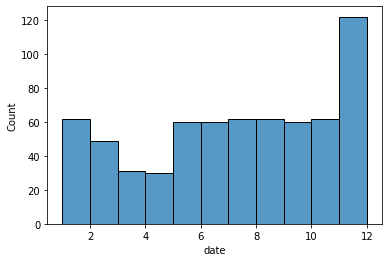

In [35]:
import seaborn as sns
sns.histplot(pd.concat([train_df, test_df], axis = 0)["date"])

In [51]:
preds_df["date"] = test_df["date"]

In [55]:
merged = pd.merge(preds_df, test_df, on = "date")

In [64]:
merged[["date", "workplace_closures_singapore", "workplace_closures_singapore_predicted"]].groupby("date").agg(pd.Series.mode)

,workplace_closures_singapore,workplace_closures_singapore_predicted
date,,
1,2,2
2,2,2
3,2,2
4,2,2
5,2,2
6,2,2
7,2,2
8,2,2
9,2,2


In [67]:
merged[["date", "restrict_public_gathering_singapore", "restrict_public_gathering_singapore_predicted"]].groupby("date").agg(pd.Series.mode)

,restrict_public_gathering_singapore,restrict_public_gathering_singapore_predicted
date,,
1,4,4
2,4,4
3,4,4
4,4,4
5,"[2, 4]",4
6,2,4
7,2,4
8,4,4
9,"[2, 4]",4


Our model is a bit on the cautious side, where a higher level of stringency is proposed for a given point in time.